<a href="https://colab.research.google.com/github/ericmermet/topomine-tools/blob/main/Topomine_prefixes_suffixes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## TopoMine

Topomine est une application web permettant d'explorer et de visualiser des données relatives à la toponymie en France. La toponymie est porteuse de sens multiples sur le temps long et parfois cachés dans l'évolution des langues et dialectes français. Agrégeant plusieurs bases de données issues de différents producteurs, Topomine allie une recherche avancée par mots-clés qui permet de faire émerger et de révéler des logiques spatiales sous-jacentes à certains phénomènes d'études en histoire, en géographie, en études environnementales, en littérature, en études du genre ou encore en généalogie.

Voir https://app.ptm.huma-num.fr/topomine/

Aujourd'hui les applications web sont des clients dits légers (i.e. dans un navigateur web) qui s'appuie sur des API (Application Programming Interface).

L'API Topomine est documentée : https://ptm.huma-num.fr/api/topomine/docs

Faire une requête sur https://app.ptm.huma-num.fr/topomine/

Observer la console du navigateur, notamment dans le réseau.

Essayer l'url : https://ptm.huma-num.fr/api/topomine/toponyme/?search=paris&search_method=default

# Prise en main de l'API



In [1]:
#imports and installs
import urllib.request, json
import geopandas as gpd
import pandas as pd
import requests

!pip install geoplot
import geoplot
import geoplot.crs as gcrs
import matplotlib.pyplot as plt
from shapely.geometry import Point

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.9/58.9 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 56.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.5/21.5 MB 46.2 MB/s eta 0:00:00


In [2]:
#url API Topomine
url_base = 'https://ptm.huma-num.fr/api/topomine/'

base_utilisee = 'toponyme/'

recherche = '?search=paris'

parametre = '&search_method=default'

url_complete = url_base + base_utilisee + recherche + parametre
url_complete

'https://ptm.huma-num.fr/api/topomine/toponyme/?search=paris&search_method=default'

In [3]:
#aller chercher des données sur le web:
with urllib.request.urlopen(url_complete) as url:
    response = json.load(url)

if(response['features'] != None):

  response_str = json.dumps(response)

  print('données récupérées sur l\'API Topomine')
  print(response_str)
  gdf = gpd.read_file(response_str, driver='GeoJSON')

else:
  print('problème de récupération des données')

données récupérées sur l'API Topomine
{"type": "FeatureCollection", "features": [{"type": "Feature", "properties": {"id": 49170, "nom": "paris", "nature": "Lieu-dit habit\u00e9", "classe": "Zone d'habitation"}, "geometry": {"type": "Point", "coordinates": [3.25338, 49.03693]}}, {"type": "Feature", "properties": {"id": 126341, "nom": "paris", "nature": "Lieu-dit non habit\u00e9", "classe": "Lieu-dit non habit\u00e9"}, "geometry": {"type": "Point", "coordinates": [6.48255, 44.48292]}}, {"type": "Feature", "properties": {"id": 149426, "nom": "paris", "nature": "Lieu-dit non habit\u00e9", "classe": "Lieu-dit non habit\u00e9"}, "geometry": {"type": "Point", "coordinates": [6.48255, 44.48292]}}, {"type": "Feature", "properties": {"id": 225854, "nom": "paris", "nature": "Lieu-dit non habit\u00e9", "classe": "Lieu-dit non habit\u00e9"}, "geometry": {"type": "Point", "coordinates": [1.95915, 42.94709]}}, {"type": "Feature", "properties": {"id": 264886, "nom": "paris", "nature": "Lieu-dit non ha

/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py:3473: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if (await self.run_code(code, result,  async_=asy)):


<Figure size 2500x5000 with 0 Axes>

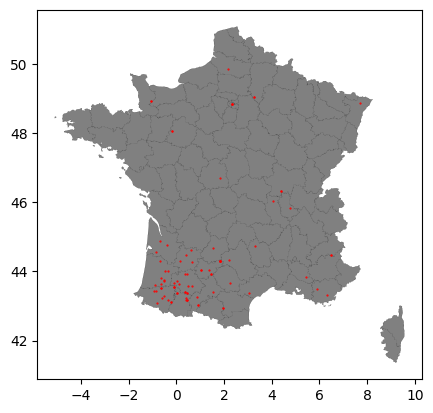

In [4]:
#créer une cartographie statique

#
#fig, axs = plt.subplots(nrows=5, ncols=6, figsize=(30, 30))
fig = plt.figure(figsize=(25,50))

#data france
data_france = gpd.read_file("https://raw.githubusercontent.com/holtzy/The-Python-Graph-Gallery/master/static/data/france.geojson")
france_surf = data_france.dissolve()

#ajout de la couche France / départements
base = data_france.plot(color='grey', edgecolor='black', linewidth = 0.1)

within_points = gpd.sjoin(gdf, france_surf, op = 'within')
within_points.plot(ax=base, marker='o', color='red', markersize=0.3);

# Recherche de préfixes et de suffixes dans Topomine

In [5]:
#définitions de préfixes et suffixes dans la toponymie, à modifier si besoin

suffixes_toponymes = [
    "ac", "ai", "ais", "aie", "an", "ancourt", "ange", "ans", "ant",
    "argue", "as", "at", "aucourt", "ay", "bec", "berg", "bergue",
    "boeuf", "bourg", "bécourt", "celles", "champs", "court",
    "courtine", "dun", "eaux", "écourt", "elle", "elles", "emont",
    "ence", "encourt", "enay", "erie", "es", "esse", "est", "et",
    "eval", "euille", "ey", "fon", "fort", "gny", "guet", "ham",
    "hont", "ieux", "ière", "igny", "illac", "in", "ines", "ing",
    "is", "ise", "isse", "le", "ley", "lieu", "ly", "mand", "mont",
    "nay", "ne", "nes", "neu", "ney", "nil", "non", "ny", "on",
    "one", "ont", "ort", "ourt", "oux", "ran", "rand", "ron",
    "ry", "sac", "sse", "thier", "tigny", "to", "ton", "tres",
    "us", "ux", "val", "vaux", "ville", "y", "zac"
]

suffixes_toponymes_low = [
    "ac", "ai", "ais", "aie", "an"
]

prefixes_toponymes = [
    "Aber", "Aix", "Al", "Am", "And", "Ange", "Ar", "Aub",
    "Av", "Bar", "Beau", "Bel", "Bern", "Bon", "Bourg",
    "Bri", "Bro", "Bru", "Can", "Car", "Cas", "Cern", "Char",
    "Châte", "Cler", "Col", "Con", "Cor", "Cour", "Cri", "Cu",
    "Darn", "Dom", "Don", "Dre", "Du", "Epi", "Esp", "Fay",
    "Fleur", "Font", "For", "Fou", "Frai", "Frem", "Fres",
    "Fri", "Gen", "Gou", "Gran", "Gui", "Her", "Ill", "In", "Iss",
    "Jan", "Jou", "Ju", "Lan", "Le", "La", "Les", "Li", "Lime", "Lou",
    "Louv", "Lu", "Mag", "Mal", "Man", "Mar", "Mas",
    "Mon", "Mont", "Mor", "Mou", "Mu", "Nau", "Ne", "Nou",
    "Or", "Par", "Pas", "Pe", "Pen", "Per", "Pi", "Pla",
    "Pont", "Pou", "Pre", "Qu", "Re", "Ren", "Ri", "Ros", "Rou",
    "Saint", "Sal", "San", "Sar", "Sau", "Sen", "Ser", "Sev", "Si",
    "Sol", "Sou", "Su", "Ta", "Tar", "Te", "Tho", "Tou",
    "Tre", "Tri", "Tro", "Val", "Van", "Var", "Ver", "Vi", "Ville",
    "Vinc", "Vou"
]

In [6]:
#paramètrage des urls de requêtes pour suffixes et préxies
recherche_suffixe = '?search=\m\w*'+suffixes_toponymes[0]+'\M'
recherche_prefixe = '?search=\m'+prefixes_toponymes[0]+'\w*\M'

parametre_prefixe_suffixe = '&search_method=regex'

url_complete_suffixe = url_base + base_utilisee + recherche_suffixe + parametre_prefixe_suffixe
url_complete_prefixe = url_base + base_utilisee + recherche_prefixe + parametre_prefixe_suffixe
#url_complete_prefixe
#url_complete_suffixe

In [7]:
#traitement pour les suffixes
import math

# donnes France / polygone coomunes
data_france = gpd.read_file("https://raw.githubusercontent.com/holtzy/The-Python-Graph-Gallery/master/static/data/france.geojson")

def construire_url(suffixe):
    recherche_suffixe = f'?search=\\m\\w*{suffixe}\\M'
    parametre_prefixe_suffixe = '&search_method=regex'
    url_complete_suffixe = url_base + base_utilisee + recherche_suffixe + parametre_prefixe_suffixe + '&limit=100000000&offset=0'
    return url_complete_suffixe

def interroger_api(suffixes):
    resultats = []
    for suffixe in suffixes:
        url = construire_url(suffixe)
        print(suffixe)
        reponse = requests.get(url)
        if reponse.status_code == 200:
            data = reponse.json()
            if 'features' in data:
                print(len(data['features']))
            else:
              print(f"Aucune feature trouvée pour le suffixe '{suffixe}'")
            resultats.append(data)
        else:
            print(f"Erreur lors de l'interrogation de l'URL: {url} (statut {reponse.status_code})'")
            resultats.append(None)
    return resultats

# traite les coordonnées des résultats / points
def extraire_coordonnees(resultats):
    points = []
    for resultat in resultats:
        if resultat and 'features' in resultat:
            for feature in resultat['features']:
                coords = feature['geometry']['coordinates']
                points.append(Point(coords))
    return points

# construire et créer une figure avec des subfigures
def creer_figure(resultats, suffixes):
    ncols = 5
    nrows = math.ceil(len(suffixes) / ncols)

    # taille en largeur / hauteur d'un subplot
    subplot_width = 4
    subplot_height = 3

    # taille de la figure / relative au subplot
    figsize = (ncols * subplot_width, nrows * subplot_height)

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
    axes = axes.flatten()

    for idx, (resultat, suffixe) in enumerate(zip(resultats, suffixes)):
        ax = axes[idx]
        # ajout couche France
        data_france.plot(ax=ax, color='lightgrey')
        if resultat and 'features' in resultat:
            coords = [feature['geometry']['coordinates'] for feature in resultat['features']]
            gdf_points = gpd.GeoDataFrame(geometry=[Point(coord) for coord in coords])
            gdf_points.plot(ax=ax, marker='.', color='red', markersize=0.1)
        ax.set_title('-'+suffixe)
        ax.axis('off')

    # enlever les sibplots qui ne seront pas utilisés
    for idx in range(len(resultats), len(axes)):
        fig.delaxes(axes[idx])

    plt.tight_layout()
    plt.show()

resultats = interroger_api(suffixes_toponymes)

creer_figure(resultats, suffixes_toponymes)

Aber
102
Aix
132
Al
11267
Am
4603
And
2332
Ange
888
Ar
25347
Aub
4944
Av
4303
Bar
25020
Beau
12991
Bel
19379
Bern
4592
Bon
8332
Bourg
5925
Bri
6593
Bro
9849
Bru
11935
Can
8646
Car
16804
Cas
10497
Cern
393
Char
14801
Châte
27674
Cler
794
Col
18818
Con
7618
Cor
14401
Cour
14934
Cri
1340
Cu
8747
Darn
131
Dom
10209
Don
1285
Dre
593
Du
87728
Epi
176
Esp
3582
Fay
3891
Fleur
2262
Font
19085
For
18283
Fou
17619
Frai
1131
Frem
91
Fres
1709
Fri
2149
Gen
5515
Gou
12864
Gran
66072
Gui
10538
Her
5208
Ill
342
In
1730
Iss
689
Jan
1582
Jou
5891
Ju
7203
Lan
19071
Le
755068
La
588086
Les
362180
Li
15953
Lime
148
Lou
13079
Louv
1566
Lu
6521
Mag
3054
Mal
10739
Man
7420
Mar
45393
Mas
18348
Mon
42773
Mont
33926
Mor
11064
Mou
54875
Mu
7369
Nau
2706
Ne
16344
Nou
6264
Or
10808
Par
15448
Pas
8430
Pe
81263
Pen
6175
Per
12699
Pi
51123
Pla
36278
Pont
13482
Pou
13254
Pre
4287
Qu
18975
Re
27011
Ren
6672
Ri
23859
Ros
5965
Rou
27793
Saint
42863
Sal
7014
San
4110
Sar
5407
Sau
11494
Sen
2295
Ser
11347
Sev
265
Si
7355
So

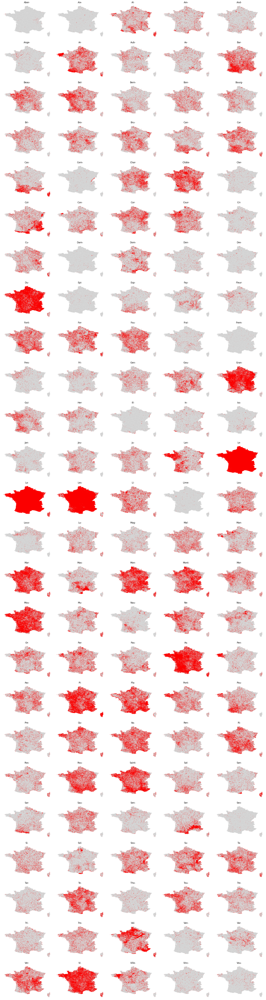

In [8]:
#traitement pour les prefixes
import math

# donnes France / polygone coomunes
data_france = gpd.read_file("https://raw.githubusercontent.com/holtzy/The-Python-Graph-Gallery/master/static/data/france.geojson")

def construire_url(prefixe):
    recherche_prefixe = '?search=\m'+prefixe+'\w*\M'
    parametre_prefixe_suffixe = '&search_method=regex'
    url_complete_prefixe = url_base + base_utilisee + recherche_prefixe + parametre_prefixe_suffixe + '&limit=100000000&offset=0'
    return url_complete_prefixe

def interroger_api(prefixes):
    resultats = []
    for prefixe in prefixes:
        url = construire_url(prefixe)
        print(prefixe)
        reponse = requests.get(url)
        if reponse.status_code == 200:
            data = reponse.json()
            if 'features' in data:
                print(len(data['features']))
            else:
                print(f"Aucune feature trouvée pour le suffixe '{prefixe}'")
            resultats.append(data)
        else:
            print(f"Erreur lors de l'interrogation de l'URL: {url} (statut {reponse.status_code})'")
            resultats.append(None)
    return resultats

def extraire_coordonnees(resultats):
    points = []
    for resultat in resultats:
        if resultat and 'features' in resultat:
            for feature in resultat['features']:
                coords = feature['geometry']['coordinates']
                points.append(Point(coords))
    return points

def creer_figure(resultats, prefixes):
    ncols = 5
    nrows = math.ceil(len(prefixes) / ncols)

    # taille en largeur / hauteur d'un subplot
    subplot_width = 4
    subplot_height = 3

    # taille de la figure / relative au subplot
    figsize = (ncols * subplot_width, nrows * subplot_height)

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
    axes = axes.flatten()

    for idx, (resultat, prefixe) in enumerate(zip(resultats, prefixes)):
        ax = axes[idx]

        data_france.plot(ax=ax, color='lightgrey')
        if resultat and 'features' in resultat:
            coords = [feature['geometry']['coordinates'] for feature in resultat['features']]
            gdf_points = gpd.GeoDataFrame(geometry=[Point(coord) for coord in coords])
            gdf_points.plot(ax=ax, marker='.', color='red', markersize=0.1)
        ax.set_title(prefixe+'-')
        ax.axis('off')

    for idx in range(len(resultats), len(axes)):
        fig.delaxes(axes[idx])

    plt.tight_layout()
    plt.show()

resultats = interroger_api(prefixes_toponymes)

creer_figure(resultats, prefixes_toponymes)

## Un exempla d'analyse des toponymes du hêtre

# Voir : https://www.researchgate.net/publication/283005937_Changement_climatique_et_toponymie_Etude_de_la_repartition_ancienne_du_hetre_a_travers_ses_traces_toponymiques

fay
3891
fag
1038
fai
1291


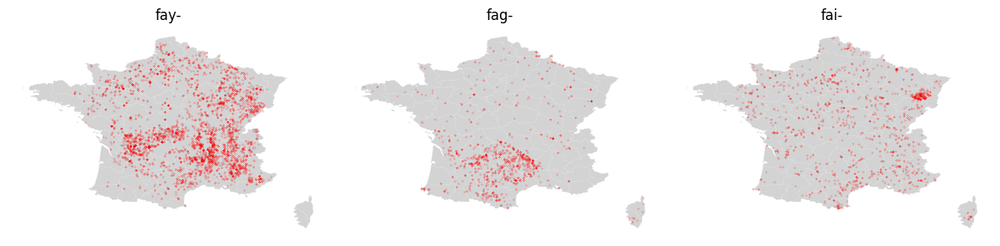

In [9]:
corpus_hetre = [
    "fay",
    "fag",
    "fai"
]

# interroger API avec le corpus des hêtres
resultats = interroger_api(corpus_hetre)

# créer le graphique de sortie à partir des résultats
creer_figure(resultats, corpus_hetre)